<a href="https://colab.research.google.com/github/ArturoMaiani/Master-Thesis---Pixies/blob/main/PPO_mappa_rettangolo_ostacoli.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Imports

In [1]:
!apt-get install ffmpeg freeglut3-dev xvfb  # For visualization
!pip install stable-baselines3[extra]

Reading package lists... Done
Building dependency tree       
Reading state information... Done
freeglut3-dev is already the newest version (2.8.1-3).
freeglut3-dev set to manually installed.
ffmpeg is already the newest version (7:3.4.11-0ubuntu0.1).
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following NEW packages will be installed:
  xvfb
0 upgraded, 1 newly installed, 0 to remove and 20 not upgraded.
Need to get 785 kB of archives.
After this operation, 2,271 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 xvfb amd64 2:1.19.6-1ubuntu4.11 [785 kB]
Fetched 785 kB in 1s (1,255 kB/s)
Selecting previously unselected package xvfb.
(Reading database ... 155676 files and directories currently installed.)
Preparing to unpack .../xvfb_2%3a1.19.6-1ubuntu4.11_amd64.deb ...
Unpacking xvfb (2:1.19.6-1ubuntu4.11) ...
Setting up xvfb (2:1.19

In [2]:
import stable_baselines3
stable_baselines3.__version__

'1.6.0'

Stable-Baselines works on environments that follow the [gym interface](https://stable-baselines.readthedocs.io/en/master/guide/custom_env.html).
You can find a list of available environment [here](https://gym.openai.com/envs/#classic_control).

It is also recommended to check the [source code](https://github.com/openai/gym) to learn more about the observation and action space of each env, as gym does not have a proper documentation.
Not all algorithms can work with all action spaces, you can find more in this [recap table](https://stable-baselines.readthedocs.io/en/master/guide/algos.html)

In [3]:

import gym
import numpy as np
from gym import Env
from gym.spaces import Discrete, Box
import random
import matplotlib.pyplot as plt
from matplotlib import colors
import time
import copy
import torch as th

The first thing you need to import is the RL model, check the documentation to know what you can use on which problem

In [4]:
from stable_baselines3 import PPO

The next thing you need to import is the policy class that will be used to create the networks (for the policy/value functions).
This step is optional as you can directly use strings in the constructor: 

```PPO('MlpPolicy', env)``` instead of ```PPO(MlpPolicy, env)```

Note that some algorithms like `SAC` have their own `MlpPolicy`, that's why using string for the policy is the recommened option.

In [5]:
from stable_baselines3.ppo import MlpPolicy

In [6]:
from google.colab import drive
from google.colab import files
drive.mount('/content/drive')

Mounted at /content/drive


## environment

### setup

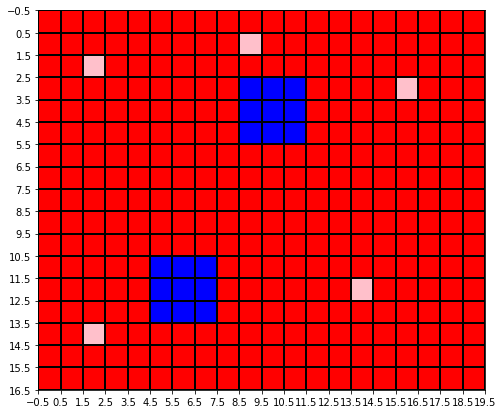

In [37]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

def Convert(string):
    string=string.replace("[","")
    string=string.replace("]","")
    li = list(string.split(", "))
    li=[float(i) for i in li]
    return li


gain=1
penalty=0.0
size_x=17
size_y=20
mosse_max=400#300
delta_t=1.05#1.2
flag_robot_su_griglia=-1
v_mid=0.5
v_small=0.3
omega_max=0.5
numero_mosse_massime=[0]
numero_partite_vinte=[0]
reward_listone=[]
lista_aree=[]
sparse_reward=True
girotondi=[0]

def init_reward_grid():
    grid=np.zeros((17,20))
    #print(a)
    somma=0

    c=0
    d=0
    e=0
    f=0
    g=0
    if 0>1:#random.randint(0,2)
      while c+d+e+f+g<3:
        c=random.randint(0,1)
        d=random.randint(0,1)
        e=random.randint(0,1)
        f=random.randint(0,1)
        g=random.randint(0,1)
    else:
      c=1
      d=1
      e=1
      f=1
      g=1
    
   

    grid[random.randint(1,3),random.randint(1,5)]=c

    indice=random.randint(0,4)
   
    grid[random.randint(3,6),random.randint(12,18)]=d

    grid[3:6,9:12]=-2
    grid[random.randint(10,14),random.randint(1,3)]=e

    grid[random.randint(11,13),random.randint(10,14)]=f
    grid[1,random.randint(9,11)]=f
    grid[11:14,5:8]=-2
    
    #grid[11:13,14:16]=np.ones((2,2))*(-1.9)

    grigliona_pixel=copy.copy(grid)#NON SI SMETTE MAI DI IMPARARE

    for i in range(17):
        for j in range(20):
            if grigliona_pixel[i,j]>0:
                somma+=grigliona_pixel[i,j]
                grigliona_pixel[i,j]=1

    return grid,somma,grigliona_pixel



#print(np.round(grid,0))
cmap = colors.ListedColormap(['blue', 'red','green','pink'])

bounds = [-2,-0.1,0.3,0.7,1]
norm = colors.BoundaryNorm(bounds, cmap.N)
    

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(init_reward_grid()[0], cmap=cmap,norm=norm)
ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
ax.set_xticks(np.arange(-0.5, 20, 1));
        
ax.set_yticks(np.arange(-0.5, 17, 1)); 





#define a function that determines if the specified location is a terminal state
def is_terminal_state(initial_x, initial_y):
  #if the reward for this location is -1, then it is not a terminal state (i.e., it is a 'white square')
  current_row_index=int(np.round(initial_x))
  current_column_index=int(np.round(initial_y))
  #print(current_row_index,current_column_index)
  reward=0
  lista=env.reward_grid[np.max([0,current_row_index-1]):np.min([current_row_index+2,19]),np.max([current_column_index-1,0]):np.min([current_column_index+2,19])].reshape(-1)
  for i  in range(len(lista)):
      if lista[i]>0:
          reward+=lista[i]

  if reward >0 or env.reward_grid[current_row_index, current_column_index] <-0.5:
    return True
  else:
    
    angolone=env.state[2]*np.pi*2 
    nuovo_x=initial_x+2*np.cos(angolone)*v_mid
    nuovo_y=initial_y+2*np.sin(angolone)*v_mid
    #print('1',nuovo_x,nuovo_y,angolone)
    if env.reward_grid[int(np.round(nuovo_x)), int(np.round(nuovo_y))] <-0.5:
        return True
    else:
        omega_=[omega_max,0,-omega_max]
        for i in omega_:
            c=angolone+2*i
            a=initial_x+2*np.cos(c)*v_mid
            b=initial_y+2*np.sin(c)*v_mid
            #print('2',a,b,c)
            if env.reward_grid[int(np.round(a)), int(np.round(b))] >-0.5:
                return False
    
def ricompensa(lista):
    reward=0
    for i  in range(len(lista)):
        if lista[i]>0:
            reward+=lista[i]
    return reward

def resetta(x,y):
    for i in range(-1,2):
        for j in range(-1,2):
            if x+i<17 and x+i>=0 and y+j<20 and y+j>=0:
                if env.reward_grid[x+i,y+j]>0:
                    env.reward_grid[x+i,y+j]=0
                    env.pixel_grid[x+i,y+j]=0
    


#define a function that will choose a random, non-terminal starting location
def get_starting_location():
  #get a random row and column index
  kkk=1#random.randint(0,1)
  if kkk>0:
    return 11, 19, 0.75
    '''
    a=random.randint(0,3)
    if a==0:
      return random.randint(1,15), 0, 0.25
    if a==1:
      return 16, random.randint(1,18), 0.5
    if a==2:
      return random.randint(1,15), 19, 0.75
    if a==3:
      return 0,random.randint(1,18),0
      '''
  if kkk==0:
    current_row_index = np.random.randint(1,size_x-2)
    current_column_index = np.random.randint(1,size_y-2)
    #continue choosing random row and column indexes until a non-terminal state is identified
    #(i.e., until the chosen state is a 'white square').
    while env.pixel_grid[current_row_index,current_column_index]<0:
      current_row_index = np.random.randint(1,size_x-2)
      current_column_index = np.random.randint(1,size_y-2)
    #print(env.reward_grid)
    #print(env.reward_grid[current_row_index, current_column_index])
    return current_row_index, current_column_index, np.random.uniform(0,1)



def vectorize_map(map):
    # map è init_pixel_grid() quindi booleana, contiene 1 dove sta la monnezza, 
    # -2 dove stanno le mura, -1 dove sta il robot e il resto 0
    vector = [i for i in np.reshape(map,-1) if i>-2]
    return vector
size=len(vectorize_map(init_reward_grid()[0]))


In [ ]:
a=list(np.zeros(2))
a.append(2)
a

[0.0, 0.0, 2]

In [38]:



action_list=[
             [v_mid,-omega_max],
             [v_mid,omega_max],
             [v_mid,0],
             ]



class PiazzaDelPopolo(Env):
    

    def __init__(self):
        
        pos_x_init=0
        pos_y_init=0
        theta_in=0
        
        self.reward_grid=[]
        self.pixel_grid=[]
        
        self.state=np.zeros(size+4)
       
        self.state[4:size+4] = np.zeros(size)
        self.state[0:4] = [pos_x_init/size_x,pos_y_init/size_y,theta_in,0]

        self.action_space = self.action_space = Discrete(len(action_list))
        highh=np.concatenate((np.array([1,1,1,1]),np.ones(size)))
        loww= np.concatenate((np.array([0,0,0,0]),-np.ones(size)))
        
            
        self.observation_space = Box(low=loww,high=highh)
        # x y theta battery %completata - pixels
        
        # l'area coperta all'inizio è zero quindi manca ancora 1
        self.stato_memoria=[]
        self.action_sequence=list(np.ones(25))
      
        self.mossa=0
    


    def step(self, action):
             
        if self.mossa >mosse_max:
            #print('allora')
            reward=-1 #? se do 0                         # se do una reward negativa fissa mi fa i giri e fa schifo
            lista_aree.append(self.state[3])              # potrei provare a non fargli finire la partita se sbatte
            numero_mosse_massime[0]+=1
            done=True
            info={}
            return self.state, reward, done, info
        # metto a zero l'elemento della pixel grid in cui stava prima il robot
        self.pixel_grid[int(np.round((size_x-1)*self.state[0])),int(np.round((size_y-1)*self.state[1]))]=0
        self.mossa+=1
        #if True==False:
        if random.randint(0,15000)==5:
            print('----------')
            print('partite vinte:',numero_partite_vinte[0])
            print('partite con troppe mosse:',numero_mosse_massime[0])
            print('girotondi:',girotondi[0])
            print('area max ultime 100 partite:',np.max(lista_aree[len(lista_aree)-100:]))
            print('----------')
            plt.figure()
            plt.hist(lista_aree[len(lista_aree)-100:])
            plt.show()
        
           #prima -0.5 era troppo
        self.stato_memoria=[self.state[0],self.state[1]]

        self.action_sequence.append(action)
        self.action_sequence=self.action_sequence[1:]
        if self.state[0]<=1 and self.state[0]>=0 and self.state[1]<=1 and self.state[1]>=0:       
            angolone=self.state[2]*np.pi*2
            self.state[0]+=delta_t*np.cos(angolone)*action_list[action][0]/(size_x-1)
            self.state[1]+=delta_t*np.sin(angolone)*action_list[action][0]/(size_y-1)
            self.state[2]+=delta_t*action_list[action][1]/(2*np.pi)
            # denormalize actions
            #lin_speed=action[0]*(v_lin_max-v_lin_min)+v_lin_min
            #ang_speed=(action[1]*(w_ang_max-w_ang_min)+w_ang_min)

            #self.state[0]+=delta_t*np.cos(angolone)*lin_speed/(size_x-1)
            #self.state[1]+=delta_t*np.sin(angolone)*lin_speed/(size_y-1)
            #self.state[2]+=delta_t*ang_speed/(2*np.pi)
            
        if self.state[2]>1:
            self.state[2]-=1
        if self.state[2]<0:
            self.state[2]+=1
            
        ollare=False
        if self.state[0]>=1:
            
            done=ollare
            reward=-penalty
            
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            
        if self.state[0]<=0:
            
            done=ollare
            reward=-penalty
            #
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            
        if self.state[1]>=1:
            
            done=ollare
            reward=-penalty
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            self.state[0:2]=self.stato_memoria
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            
        if self.state[1]<=0:
            done=ollare
            reward=-penalty
            
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info = {}
            reward_listone.append(reward)
            return self.state, reward, done, info'''

        
        if self.reward_grid[int(np.round((size_x-1)*self.state[0])),int(np.round((size_y-1)*self.state[1]))]<-1.6:
            done =ollare
            reward=-penalty
            
            
            self.state[0:2]=self.stato_memoria
            self.pixel_grid[int(np.round(self.state[0]*(size_x-1))),int(np.round(self.state[1]*(size_y-1)))]=flag_robot_su_griglia
            self.state[4:size+4] = vectorize_map(self.pixel_grid)
            '''
            lista_aree.append(self.state[3])
            info={}
            reward_listone.append(reward)
            return self.state, reward, done, info'''
            

        # battery decrease
        
        
        

        
        pos_x=int(np.round(self.state[0]*(size_x-1)))
        pos_y=int(np.round(self.state[1]*(size_y-1)))

        
        

        # prende il valore della casella : 
        
        reward=ricompensa(self.reward_grid[np.max([0,pos_x-1]):np.min([pos_x+2,19]),np.max([pos_y-1,0]):np.min([pos_y+2,19])].reshape(-1))
        
        # metto a 3 l'elemento della pixel grid in cui sta attualmente il robot
        self.pixel_grid[pos_x,pos_y]=flag_robot_su_griglia

#-------Garbage collected----------------------------------------        
        if reward>0:
            #print('preso',reward)
            #remove garbage from square
            resetta(pos_x,pos_y)
            self.state[3]+=reward/self.somma
        
        # AGGIORNO LO STATO!!!!!! MI ERO DIMENTICATO
        #if len(vectorize_map(self.pixel_grid))>size:
        #  plottagrid(self.pixel_grid.reshape(size_x,size_y))
          
        self.state[4:size+4] = vectorize_map(self.pixel_grid)
         #define a function that determines if the specified location is a terminal state
        
        if self.mossa >mosse_max:
            reward=-1 #? se do 0                         # se do una reward negativa fissa mi fa i giri e fa schifo
            lista_aree.append(self.state[3])              # potrei provare a non fargli finire la partita se sbatte
            numero_mosse_massime[0]+=1
            done=True
            info={}
            return self.state, reward, done, info
        else: 
            done=False
            
        if self.state[3]>=0.99:# il 3 è l'AREA COPERTA!!!!
            reward=1
            lista_aree.append(self.state[3])
            numero_partite_vinte[0]+=1
            #print('we')
            done=True
            info={}
            return self.state, reward, done, info
        if self.action_sequence.count(0)>23 or self.action_sequence.count(2)>23:
            girotondi[0]+=1

   
        

        info = {}
        reward=reward*0.5*(1+self.state[3])**2
  

        # Return step information
        return self.state, reward, done, info

       #elif self.action_sequence.count(0)>20 or self.action_sequence.count(2)>20:
       #     print('olle',self.action_sequence)
        #    reward=0
         #   lista_aree.append(self.state[3])
          #  numero_mosse_massime[0]+=1
           # done=False
#elif self.action_sequence.count(0)>25 or self.action_sequence.count(2)>25:
#print('olle',self.action_sequence)
#reward=-1
#lista_aree.append(self.state[3])
#numero_mosse_massime[0]+=1
#done=True

    def render(self):
        pass
    
    
    
    def reset(self):
        self.state=np.zeros(size+4)
        
       
        #print(a)
        
        self.GRIGLIA_INIZIALE=init_reward_grid()

        self.reward_grid=self.GRIGLIA_INIZIALE[0]
        
        
        
        self.somma=self.GRIGLIA_INIZIALE[1]
        #print('somma',self.somma)
        self.pixel_grid=self.GRIGLIA_INIZIALE[2]
        
        pos_x_reset,pos_y_reset,theta_in=get_starting_location() #this is integer
        #theta_in=random.uniform(0,1)
        self.state[2]=theta_in
        #pos_x_reset,pos_y_reset=[11,16]
        self.pixel_grid[pos_x_reset,pos_y_reset]=flag_robot_su_griglia
        
        self.state[0:2] = [pos_x_reset/(size_x-1),pos_y_reset/(size_y-1)]
        self.state[4:size+4] = vectorize_map(self.pixel_grid)
        
     
        self.mossa=0
        
        
        return self.state

# FONDAMENTALE PER CREARE L ENVIRONMENT
env=PiazzaDelPopolo()

def plottagrid(matrice):
    
    px=env.state[0]*(size_x-1)
    py=env.state[1]*(size_y-1)
    cmap = colors.ListedColormap(['blue', 'red','green','pink'])
    bounds = [-2,-0.1,0.1,0.3,0.5]
    norm = colors.BoundaryNorm(bounds, cmap.N)
    theta=env.state[2]*2*np.pi
    lungo=1

    fig, ax = plt.subplots(figsize=(8, 8))
   
    ax.imshow(matrice, cmap=cmap,norm=norm)
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-0.5, 20, 1));
        
    ax.set_yticks(np.arange(-0.5, 17, 1)); 
 
    plt.plot([py,py+lungo*np.sin(theta)],[px,px+lungo*np.cos(theta)],linewidth=5,color='white')
    plt.plot(py, px, marker="o", markersize=20, markeredgecolor="white", markerfacecolor="white")


/usr/local/lib/python3.7/dist-packages/gym/spaces/box.py:74: UserWarning: WARN: Box bound precision lowered by casting to float32
  "Box bound precision lowered by casting to {}".format(self.dtype)


In [ ]:
girotondi

[0]

posizione [11.6875, 19.44736842105263, 4.71238898038469, 0.0] reward 0.0 azione [0.5, 0]
posizione [11.6875, 18.89473684210526, 4.187388980384689, 0.0] reward 0.0 azione [0.5, -0.5]
posizione [11.407917120830398, 18.416531505945215, 4.187388980384689, 0.0] reward 0.0 azione [0.5, 0]
posizione [11.128334241660793, 17.938326169785167, 4.187388980384689, 0.0] reward 0.0 azione [0.5, 0]
posizione [10.84875136249119, 17.460120833625123, 4.187388980384689, 0.0] reward 0.0 azione [0.5, 0]
posizione [10.569168483321588, 16.981915497465074, 4.71238898038469, 0.0] reward 0.0 azione [0.5, 0.5]
posizione [10.569168483321588, 16.429283918517704, 4.187388980384689, 0.0] reward 0.0 azione [0.5, -0.5]
posizione [10.289585604151984, 15.951078582357658, 4.187388980384689, 0.0] reward 0.0 azione [0.5, 0]
posizione [10.010002724982382, 15.472873246197612, 4.187388980384689, 0.0] reward 0.0 azione [0.5, 0]
posizione [9.73041984581278, 14.994667910037565, 3.66238898038469, 0.0] reward 0.0 azione [0.5, -0.5]

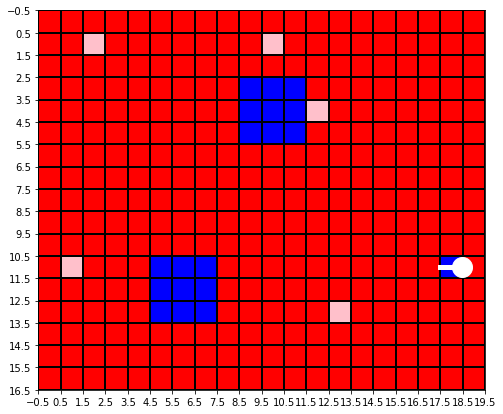

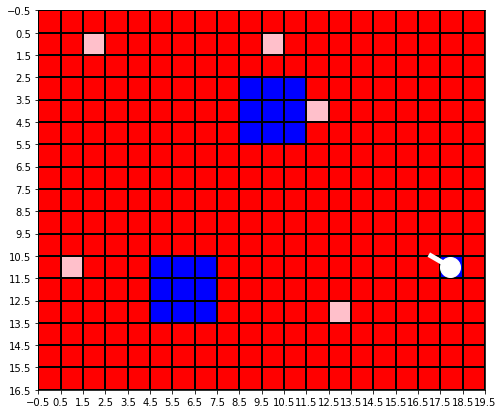

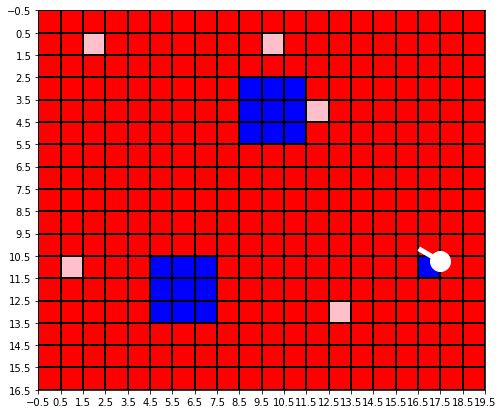

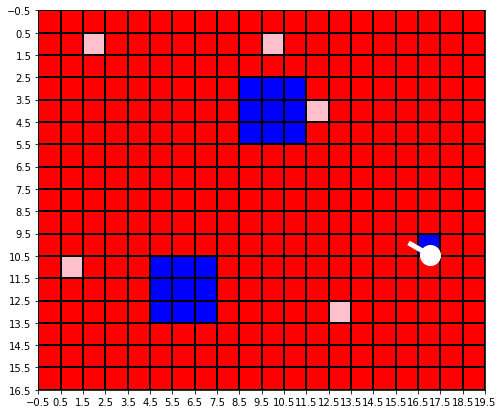

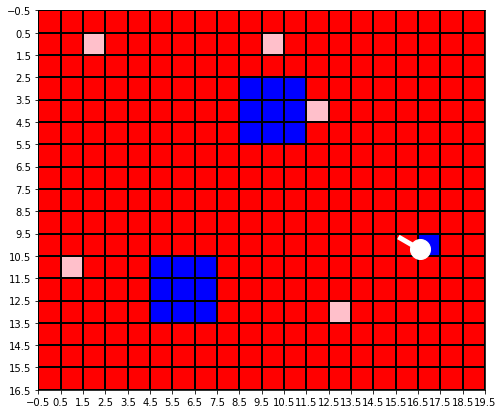

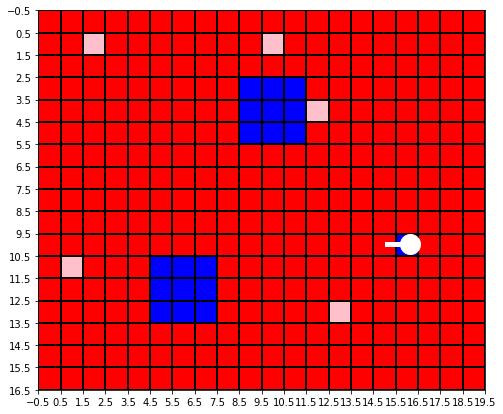

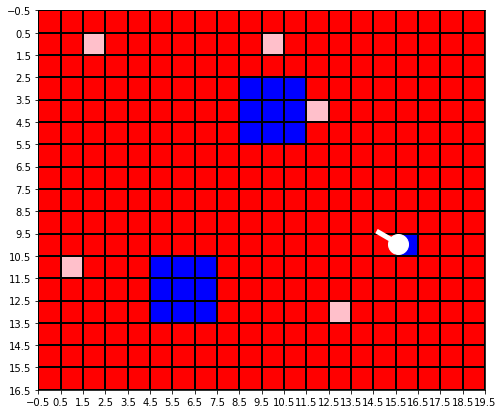

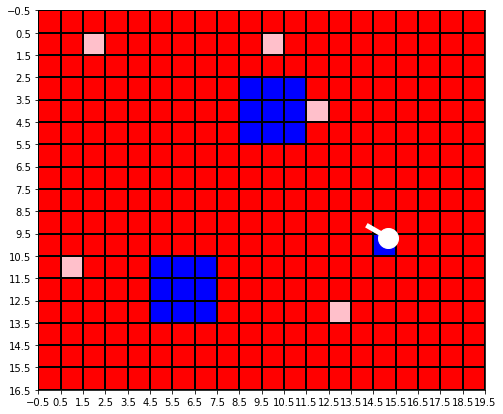

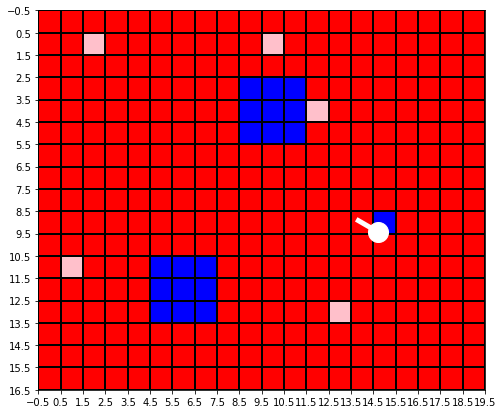

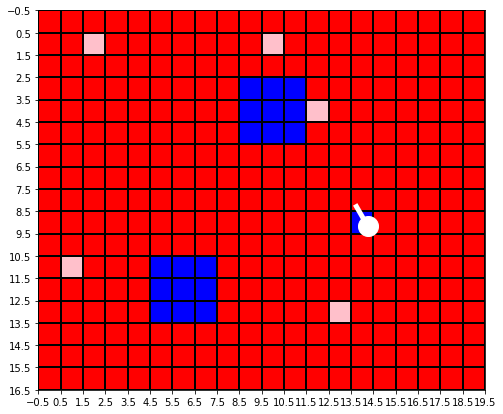

In [28]:
episodes = 1
for episode in range(1, episodes+1):
    env.reset()
    #print(env.action_sequence)
    #print(np.multiply(env.reset()[0:2],size))
    #print(env.reward_grid)
    #print('batteria',env.state[3])
    #env.state[0:2]=[0.7,0.5]
    done = False
    score = 0 
    #print('iniz',[env.state[0]*size_x,env.state[1]*size_y,env.state[2]])
    #while not done:
    for i in range(10):
        if done==True:
          print('cazzo')
          print('mossa numero',env.mossa)
          print('posizione',[env.state[0]*size_x,env.state[1]*size_y,env.state[2]*np.pi*2,env.state[3]],'reward',reward,'azione',action_list[action])
          #plottagrid(env.pixel_grid.reshape(size_x,size_y))
          print(env.action_sequence)
          break
        
        #env.render()
        #temp=[env.state[0],env.state[1]]
        action = env.action_space.sample()
        #action=0
        #action = 0
        n_state, reward, done, info = env.step(action)
        #print(np.round(env.reward_grid,2))
        score+=reward
        #print(np.round(env.pixel_grid,1))
        
        plottagrid(env.pixel_grid.reshape(size_x,size_y))
        #drawnow()

        #print('mossa numero',env.mossa)
        print('posizione',[env.state[0]*size_x,env.state[1]*size_y,env.state[2]*np.pi*2,env.state[3]],'reward',reward,'azione',action_list[action])
        
        #print('------------------------------------------------------------------')
       

In [ ]:
a=[0,1,1,1,1,1,0,1]
a.count([1,1,1,1,1])

0

### modello

In [71]:
#0.0000065
lrr=0.000065#0.00005,grigia,#0.00004,#0.000035
# 300 k at 0.0002
# 500 k at 0.0001
# 300 k at 0.00007
# 300 k at 0.00005
# 300 k at 0.00002
# 1 M at 0.00001
# 1 M at 0.000009
policy_kwargs = dict(activation_fn=th.nn.Tanh,
                     net_arch=[dict(pi=[400, 400,400], vf=[400, 400,400])])

primo_allenamento=False

# n_steps was 400, architecture [300, 300] , n_epochs=8

if primo_allenamento:
    model = PPO(MlpPolicy, env,policy_kwargs=policy_kwargs,ent_coef=0.00, gamma=0.995,verbose=0,learning_rate=lrr,n_steps=3000,n_epochs=4,batch_size=600,tensorboard_log="./pixies_tensorboard/")
else:
    model = PPO(MlpPolicy, env,policy_kwargs=policy_kwargs, ent_coef=0.0001,gamma=0.995,verbose=0,learning_rate=lrr,n_steps=3000,n_epochs=4,batch_size=900,tensorboard_log="./pixies_tensorboard/")
    model.set_parameters('/content/drive/MyDrive/Colab_Notebooks/scripts_tesi/PPO_nostop.zip')

#ent_coef=0.0

#stable_baselines3.ppo.PPO(policy, env, learning_rate=0.0003, 
#                           n_steps=2048, batch_size=64, n_epochs=10, gamma=0.99,
#                            gae_lambda=0.95, clip_range=0.2, clip_range_vf=None, 
#                           normalize_advantage=True, ent_coef=0.0, vf_coef=0.5, max_grad_norm=0.5,
#                              use_sde=False, sde_sample_freq=-1, target_kl=None, tensorboard_log=None, 
#                           create_eval_env=False, policy_kwargs=None, verbose=0, seed=None, device='auto',
#                            _init_setup_model=True)

/usr/local/lib/python3.7/dist-packages/stable_baselines3/ppo/ppo.py:147: UserWarning: You have specified a mini-batch size of 900, but because the `RolloutBuffer` is of size `n_steps * n_envs = 3000`, after every 3 untruncated mini-batches, there will be a truncated mini-batch of size 300
We recommend using a `batch_size` that is a factor of `n_steps * n_envs`.
Info: (n_steps=3000 and n_envs=1)
  f"You have specified a mini-batch size of {batch_size},"


In fact, Stable-Baselines3 already provides you with that helper:

In [ ]:
from stable_baselines3.common.evaluation import evaluate_policy

Let's evaluate the un-trained agent, this should be a random agent.

## Train the agent and evaluate it

In [ ]:
300*500+500*500+500*3

401500

In [41]:
%load_ext tensorboard
%tensorboard --logdir ./pixies_tensorboard/

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

----------
partite vinte: 23292
partite con troppe mosse: 7276
girotondi: 117844
area max ultime 100 partite: 1.0
----------


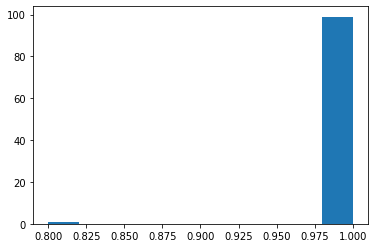

----------
partite vinte: 23315
partite con troppe mosse: 7276
girotondi: 117851
area max ultime 100 partite: 1.0
----------


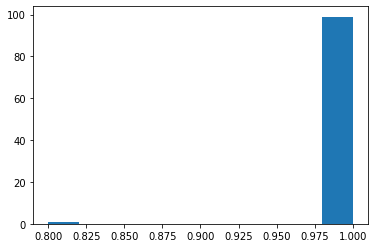

----------
partite vinte: 23382
partite con troppe mosse: 7278
girotondi: 118055
area max ultime 100 partite: 1.0
----------


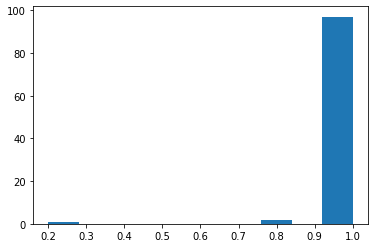

----------
partite vinte: 23410
partite con troppe mosse: 7279
girotondi: 118126
area max ultime 100 partite: 1.0
----------


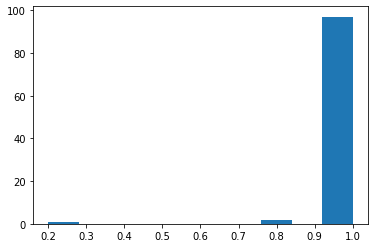

----------
partite vinte: 23571
partite con troppe mosse: 7285
girotondi: 118415
area max ultime 100 partite: 1.0
----------


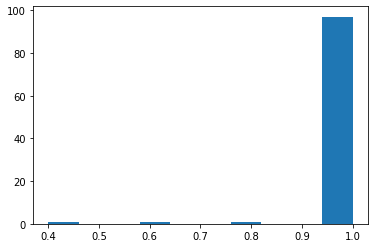

----------
partite vinte: 23664
partite con troppe mosse: 7289
girotondi: 118607
area max ultime 100 partite: 1.0
----------


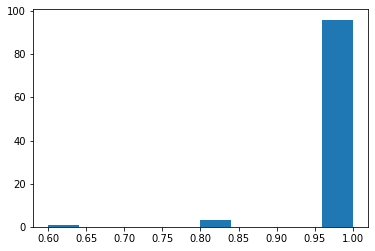

----------
partite vinte: 23702
partite con troppe mosse: 7291
girotondi: 118617
area max ultime 100 partite: 1.0
----------


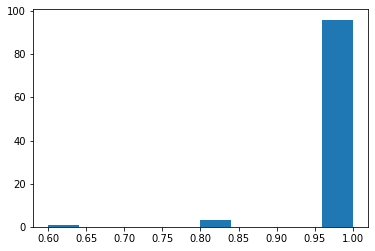

----------
partite vinte: 23730
partite con troppe mosse: 7291
girotondi: 118622
area max ultime 100 partite: 1.0
----------


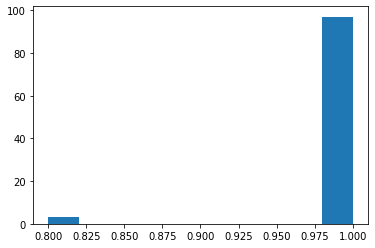

----------
partite vinte: 24263
partite con troppe mosse: 7304
girotondi: 119675
area max ultime 100 partite: 1.0
----------


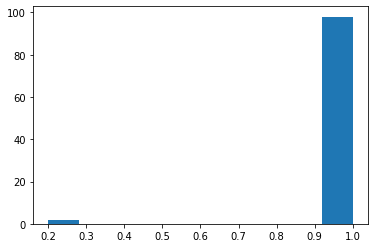

----------
partite vinte: 24326
partite con troppe mosse: 7310
girotondi: 120190
area max ultime 100 partite: 1.0
----------


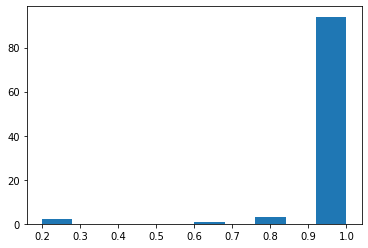

----------
partite vinte: 24328
partite con troppe mosse: 7310
girotondi: 120190
area max ultime 100 partite: 1.0
----------


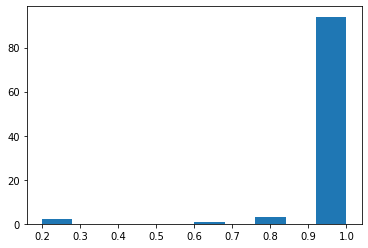

----------
partite vinte: 24415
partite con troppe mosse: 7313
girotondi: 120201
area max ultime 100 partite: 1.0
----------


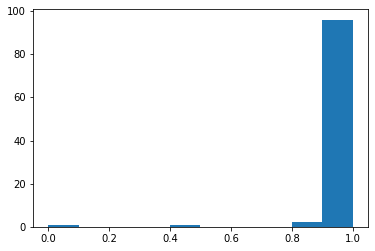

----------
partite vinte: 24491
partite con troppe mosse: 7313
girotondi: 120258
area max ultime 100 partite: 1.0
----------


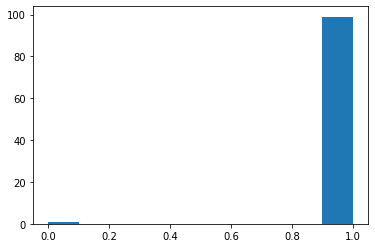

----------
partite vinte: 24533
partite con troppe mosse: 7315
girotondi: 120269
area max ultime 100 partite: 1.0
----------


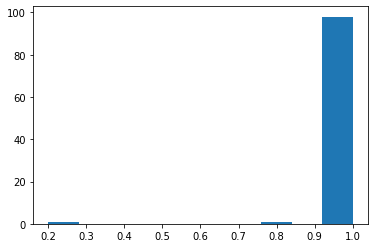

----------
partite vinte: 24862
partite con troppe mosse: 7324
girotondi: 121031
area max ultime 100 partite: 1.0
----------


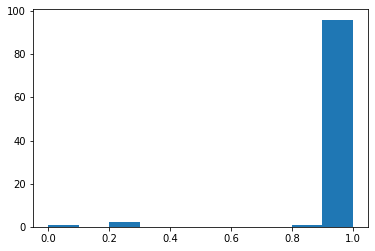

----------
partite vinte: 24915
partite con troppe mosse: 7324
girotondi: 121051
area max ultime 100 partite: 1.0
----------


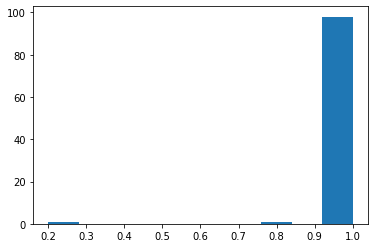

----------
partite vinte: 24929
partite con troppe mosse: 7325
girotondi: 121256
area max ultime 100 partite: 1.0
----------


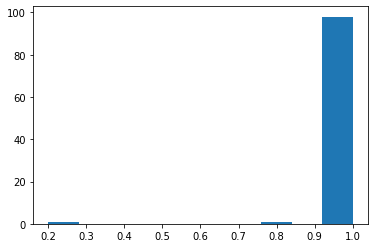

----------
partite vinte: 24982
partite con troppe mosse: 7325
girotondi: 121263
area max ultime 100 partite: 1.0
----------


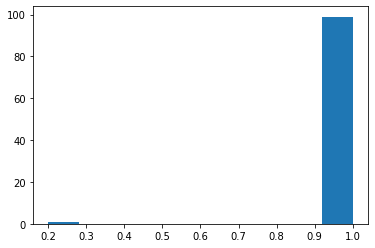

----------
partite vinte: 25006
partite con troppe mosse: 7325
girotondi: 121441
area max ultime 100 partite: 1.0
----------


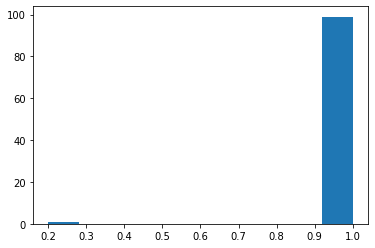

----------
partite vinte: 25011
partite con troppe mosse: 7325
girotondi: 121447
area max ultime 100 partite: 1.0
----------


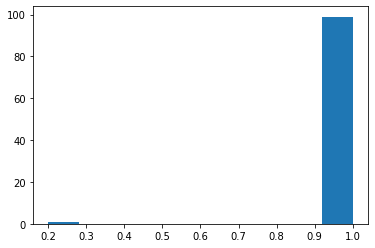

----------
partite vinte: 25108
partite con troppe mosse: 7326
girotondi: 121558
area max ultime 100 partite: 1.0
----------


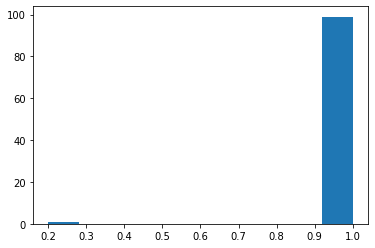

----------
partite vinte: 25180
partite con troppe mosse: 7327
girotondi: 121864
area max ultime 100 partite: 1.0
----------


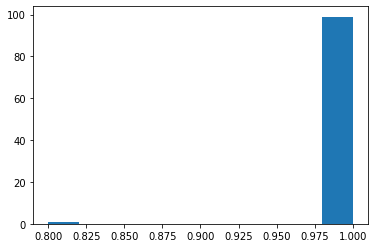

----------
partite vinte: 25200
partite con troppe mosse: 7327
girotondi: 121869
area max ultime 100 partite: 1.0
----------


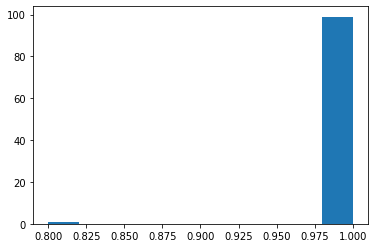

----------
partite vinte: 25213
partite con troppe mosse: 7327
girotondi: 121873
area max ultime 100 partite: 1.0
----------


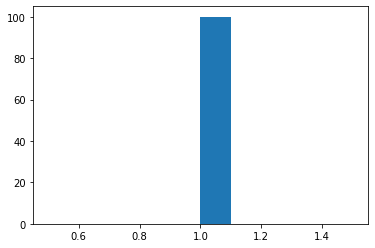

----------
partite vinte: 25226
partite con troppe mosse: 7328
girotondi: 122024
area max ultime 100 partite: 1.0
----------


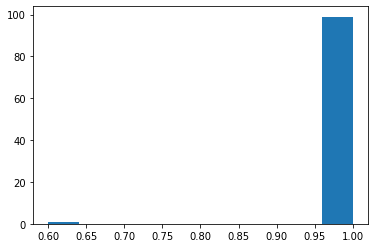

----------
partite vinte: 25298
partite con troppe mosse: 7333
girotondi: 122382
area max ultime 100 partite: 1.0
----------


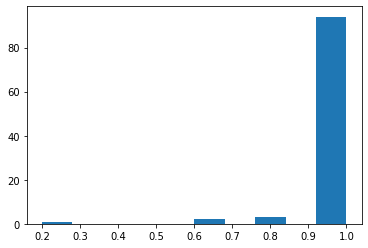

----------
partite vinte: 25370
partite con troppe mosse: 7333
girotondi: 122444
area max ultime 100 partite: 1.0
----------


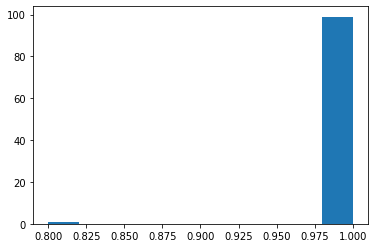

----------
partite vinte: 25401
partite con troppe mosse: 7335
girotondi: 122578
area max ultime 100 partite: 1.0
----------


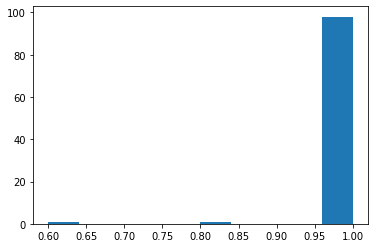

----------
partite vinte: 25508
partite con troppe mosse: 7341
girotondi: 122764
area max ultime 100 partite: 1.0
----------


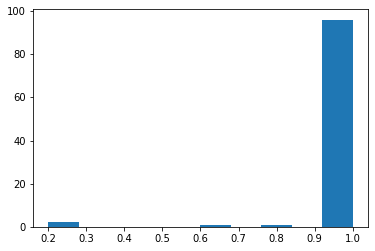

----------
partite vinte: 25650
partite con troppe mosse: 7347
girotondi: 123511
area max ultime 100 partite: 1.0
----------


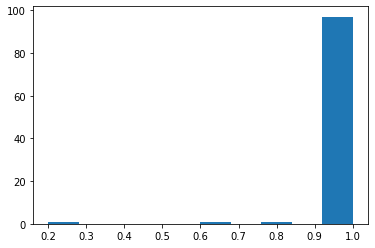

----------
partite vinte: 25705
partite con troppe mosse: 7350
girotondi: 123835
area max ultime 100 partite: 1.0
----------


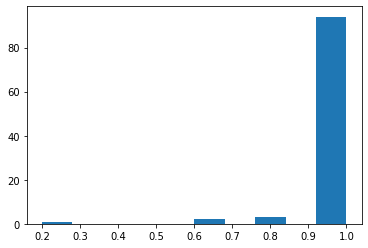

----------
partite vinte: 26171
partite con troppe mosse: 7369
girotondi: 125263
area max ultime 100 partite: 1.0
----------


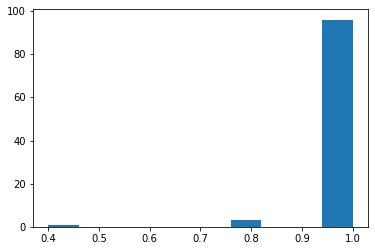

----------
partite vinte: 26204
partite con troppe mosse: 7371
girotondi: 125265
area max ultime 100 partite: 1.0
----------


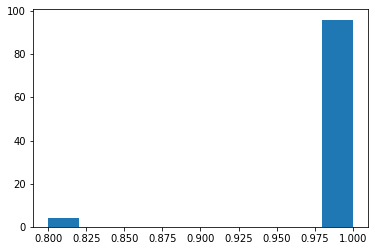

----------
partite vinte: 26223
partite con troppe mosse: 7371
girotondi: 125272
area max ultime 100 partite: 1.0
----------


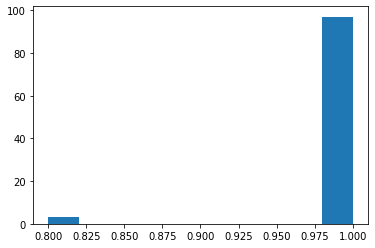

----------
partite vinte: 26348
partite con troppe mosse: 7379
girotondi: 125414
area max ultime 100 partite: 1.0
----------


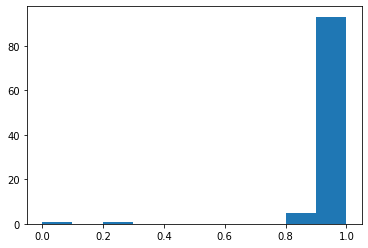

----------
partite vinte: 26400
partite con troppe mosse: 7381
girotondi: 125421
area max ultime 100 partite: 1.0
----------


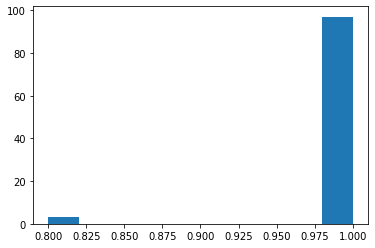

----------
partite vinte: 26466
partite con troppe mosse: 7383
girotondi: 125480
area max ultime 100 partite: 1.0
----------


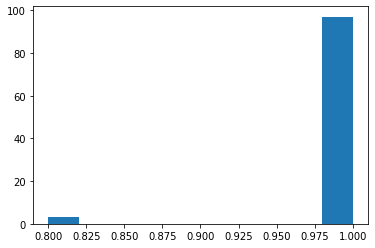

----------
partite vinte: 26499
partite con troppe mosse: 7385
girotondi: 126051
area max ultime 100 partite: 1.0
----------


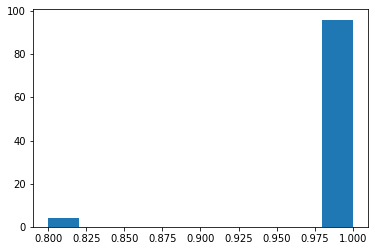

----------
partite vinte: 26628
partite con troppe mosse: 7388
girotondi: 126403
area max ultime 100 partite: 1.0
----------


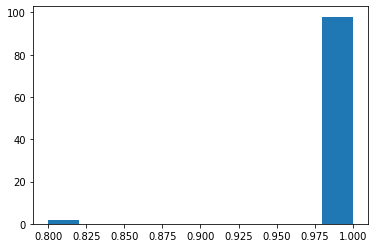

----------
partite vinte: 26860
partite con troppe mosse: 7394
girotondi: 127080
area max ultime 100 partite: 1.0
----------


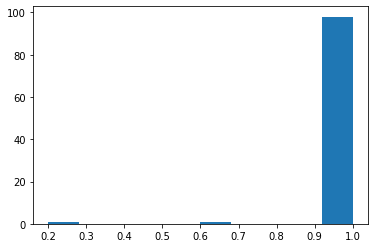

----------
partite vinte: 26943
partite con troppe mosse: 7395
girotondi: 127137
area max ultime 100 partite: 1.0
----------


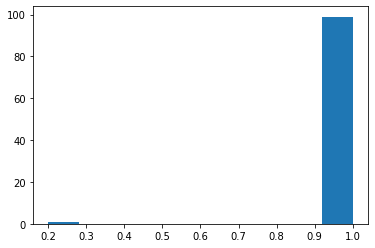

----------
partite vinte: 27105
partite con troppe mosse: 7399
girotondi: 127593
area max ultime 100 partite: 1.0
----------


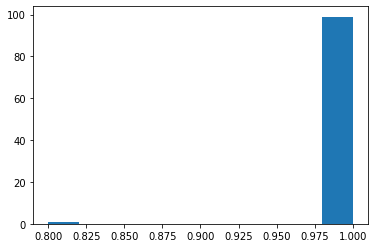

In [72]:
# ho pensato di ridurre omega max per far fare meno curve
# ho pensato anche di allungare la lista di azioni dopo cui far morire
# ho pensato di aumentare la rete
# ho pensato di usare l'entropia

# Train the agent for 10000 steps


#PROVA AD AGGIUNGERE UNA PICCOLA PENALTY SULLE BARRIERE

model.learn(total_timesteps=500000)
#model.save("PPO_checkpoint_")
#!cp PPO_checkpoint_.zip /content/drive/MyDrive/Colab_Notebooks/scripts_tesi

In [ ]:
1+0.5*(1.2+1.4+1.6+1.8)

In [62]:
model.save("PPO_nostop")
!cp PPO_nostop.zip /content/drive/MyDrive/Colab_Notebooks/scripts_tesi

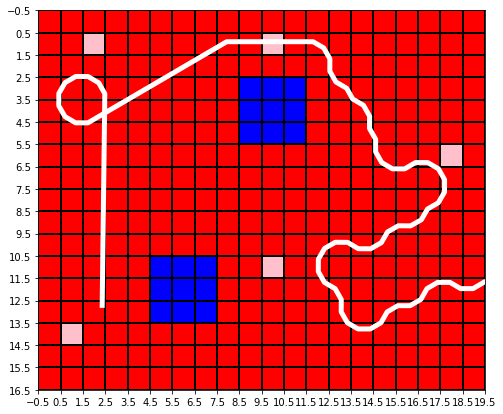

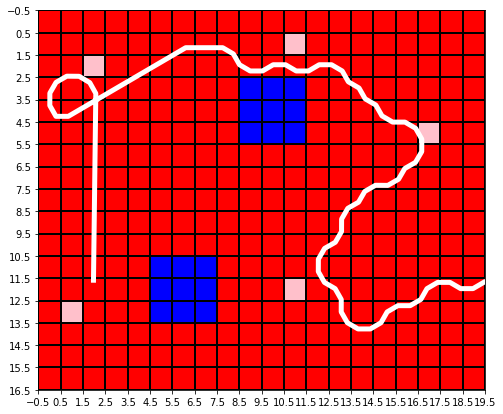

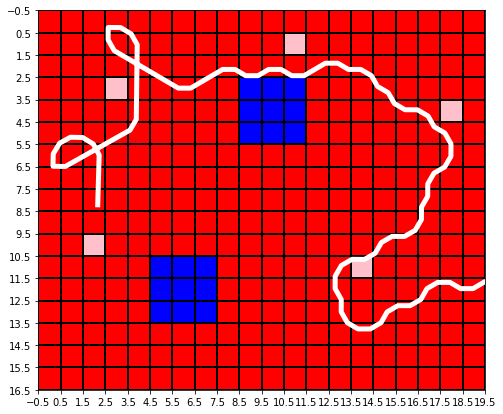

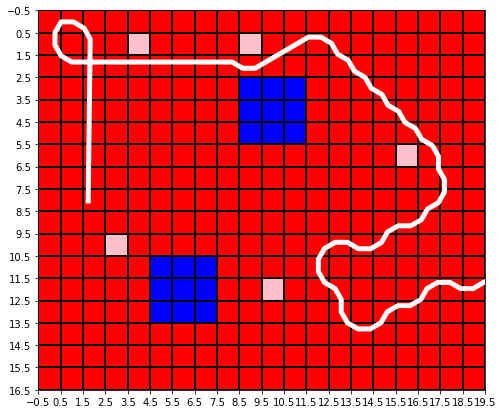

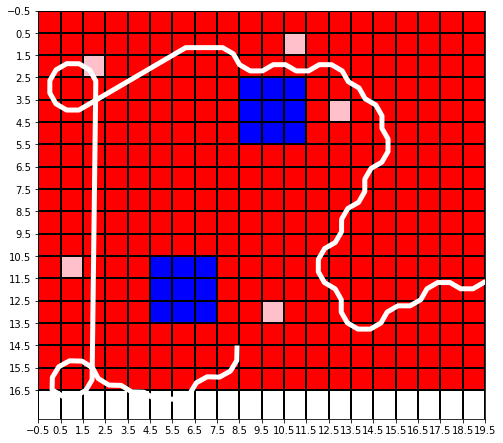

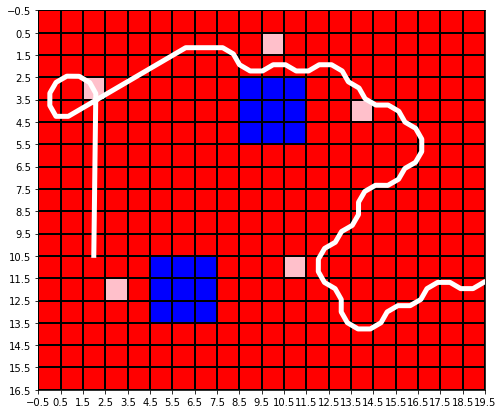

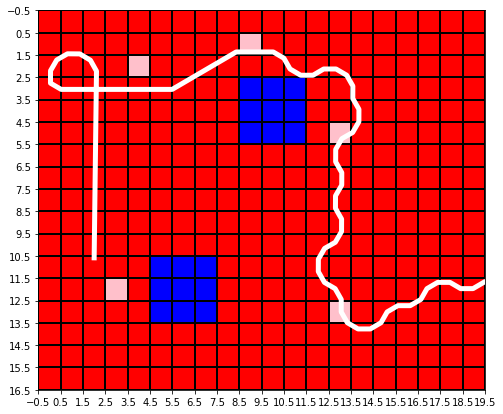

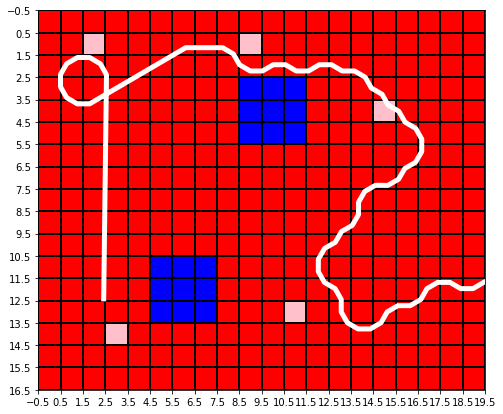

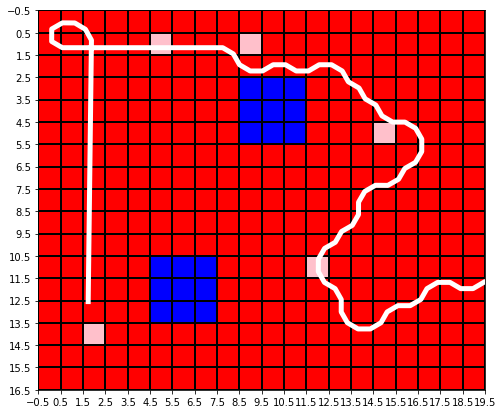

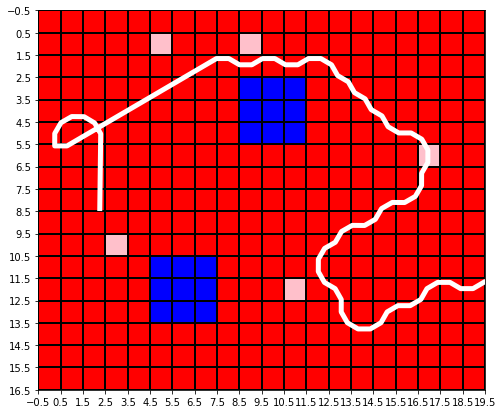

In [73]:
episodes = 10




for episode in range(1, episodes+1):
    statess=np.zeros((2,400))
    obs = env.reset()
    mappaa=copy.deepcopy(env.reward_grid)
    statess[:,0]=[obs[0],obs[1]]

    done = False
    k=0
    for i in range(400):
        if done==True:
            break
        #action=int(lista_azioni[indice,i])
        action, _states = model.predict(obs,deterministic=True)
        statess[:,i]=[env.state[0],env.state[1]]
        obs, reward, done, info = env.step(action)
        k=i
    if env.state[3]>0.9:
        cmap = colors.ListedColormap(['blue', 'red','green','pink'])
        bounds = [-2,-0.1,0.1,0.3,0.5]
        norm = colors.BoundaryNorm(bounds, cmap.N)

        fig, ax = plt.subplots(figsize=(8, 8))

        ax.imshow(mappaa, cmap=cmap,norm=norm)
        ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
        ax.set_xticks(np.arange(-0.5, 20, 1));
          
        ax.set_yticks(np.arange(-0.5, 17, 1)); 
        plt.plot(statess[1,1:k]*size_y,statess[0,1:k]*size_x,linewidth=5,color='white')

------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:288: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


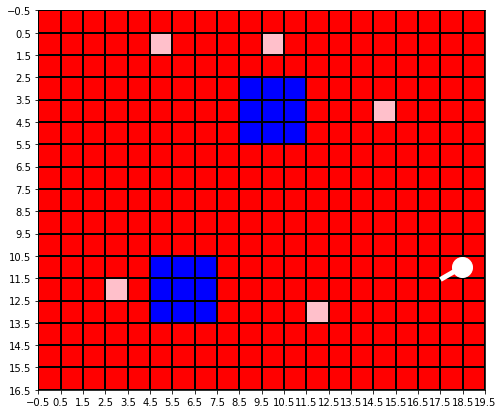

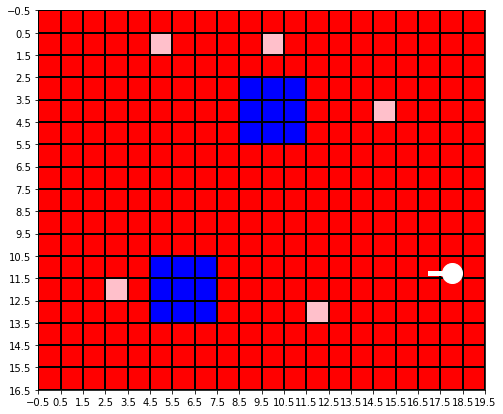

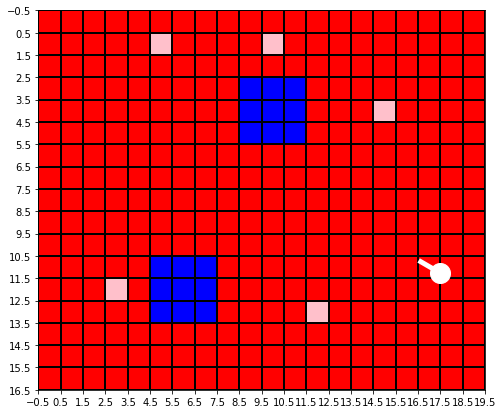

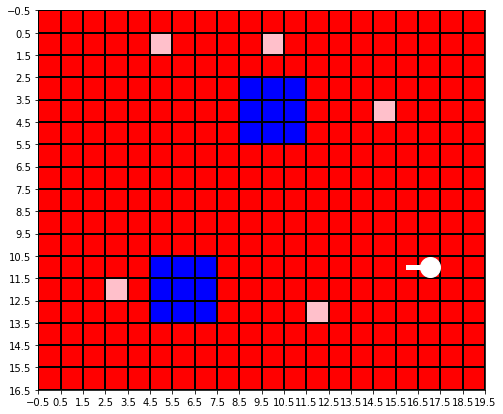

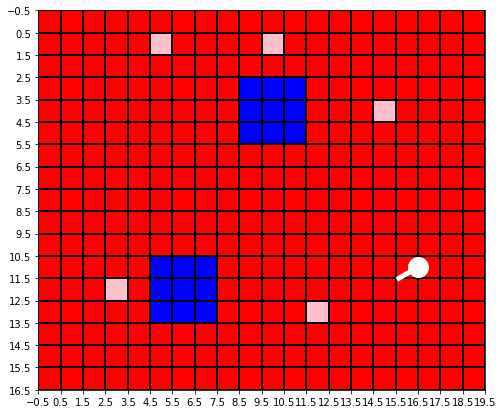

...

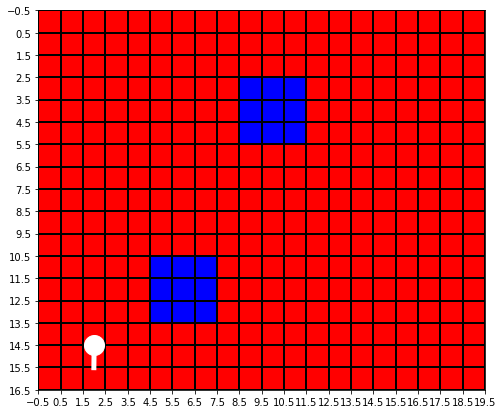

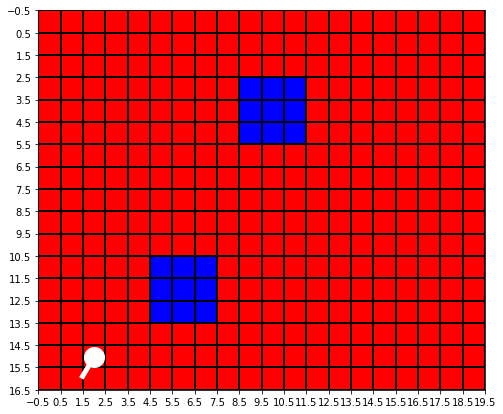

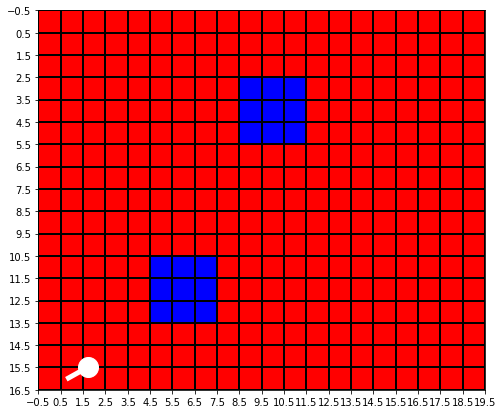

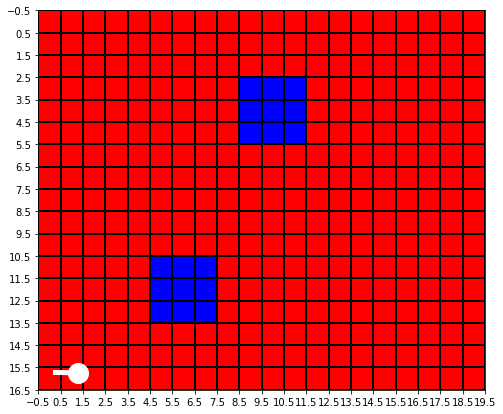

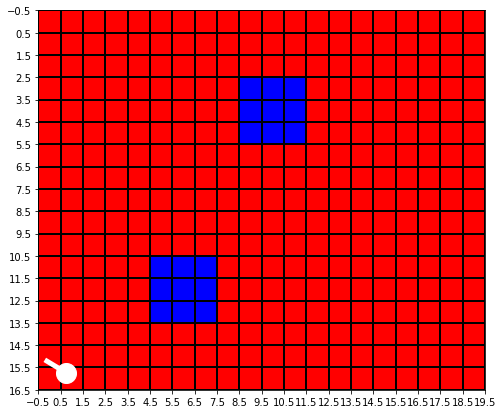

In [70]:
episodes = 1
for episode in range(1, episodes+1):
    obs = env.reset()
    print('------------')
    done = False

    for i in range(100):
        if done==True:
            break
        action, _states = model.predict(obs)
        obs, reward, dones, info = env.step(action)
        plottagrid(env.reward_grid.reshape(size_x,size_y))

In [ ]:
model.save("PPO_square_checkpoint")
!cp PPO_square_checkpoint.zip /content/drive/MyDrive/Colab_Notebooks/scripts_tesi

In [ ]:
import os
import numpy as np
import pandas as pd

from collections import defaultdict
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator


def tabulate_events(dpath):
    summary_iterators = [EventAccumulator(os.path.join(dpath, dname)).Reload() for dname in os.listdir(dpath)]

    tags = summary_iterators[0].Tags()['scalars']

    for it in summary_iterators:
        assert it.Tags()['scalars'] == tags

    out = defaultdict(list)
    steps = []

    for tag in tags:
        steps = [e.step for e in summary_iterators[0].Scalars(tag)]

        for events in zip(*[acc.Scalars(tag) for acc in summary_iterators]):
            assert len(set(e.step for e in events)) == 1

            out[tag].append([e.value for e in events])

    return out, steps


def to_csv(dpath):
    dirs = os.listdir(dpath)

    d, steps = tabulate_events(dpath)
    tags, values = zip(*d.items())
    np_values = np.array(values)

    for index, tag in enumerate(tags):
        df = pd.DataFrame(np_values[index], index=steps, columns=dirs)
        df.to_csv(get_file_path(dpath, tag))


def get_file_path(dpath, tag):
    file_name = tag.replace("/", "_") + '.csv'
    folder_path = os.path.join(dpath, 'csv')
    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    return os.path.join(folder_path, file_name)


if __name__ == '__main__':
    path = "path_to_your_summaries"
    to_csv(path)

In [ ]:
parametri=model.get_parameters()


In [ ]:
parametri

In [ ]:
parametri['policy']['mlp_extractor.policy_net.0.weight'].size()

torch.Size([150, 155])

In [ ]:
parametri['policy']['mlp_extractor.policy_net.0.bias'].size()

torch.Size([150])

In [ ]:
parametri['policy']['mlp_extractor.policy_net.2.weight'].size()

torch.Size([150, 150])

In [ ]:
parametri['policy']['mlp_extractor.policy_net.2.bias'].size()

torch.Size([150])

In [ ]:

parametri['policy']['action_net.weight'].size()

torch.Size([5, 150])

In [ ]:
parametri['policy']['action_net.bias'].size()

torch.Size([5])

------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:242: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


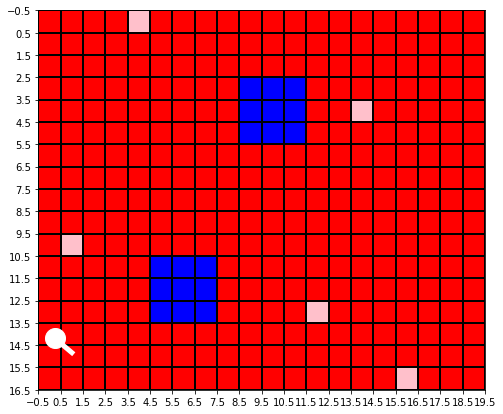

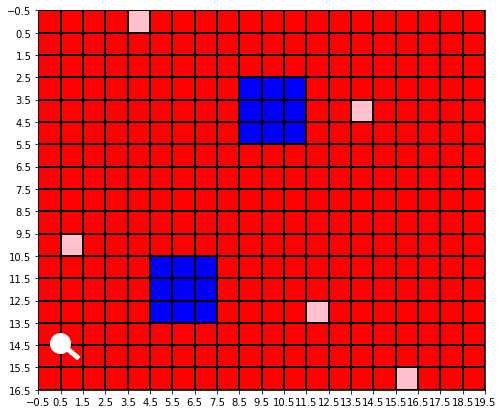

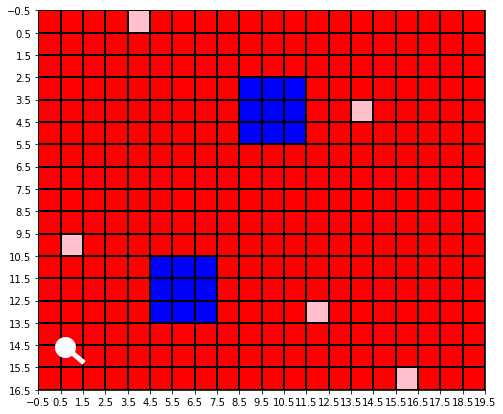

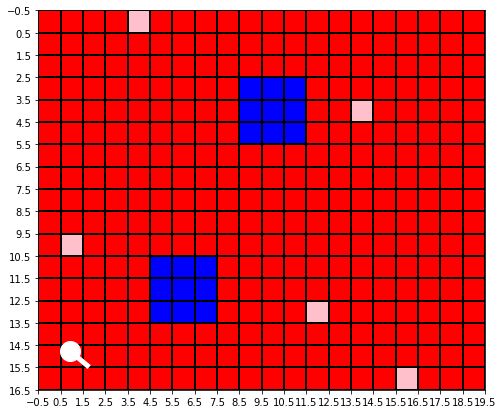

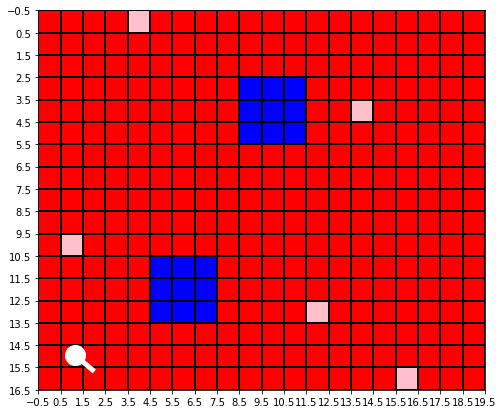

...

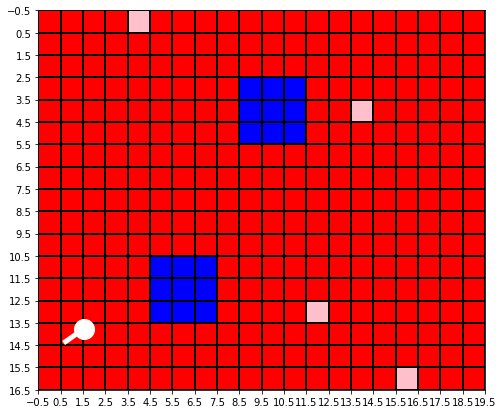

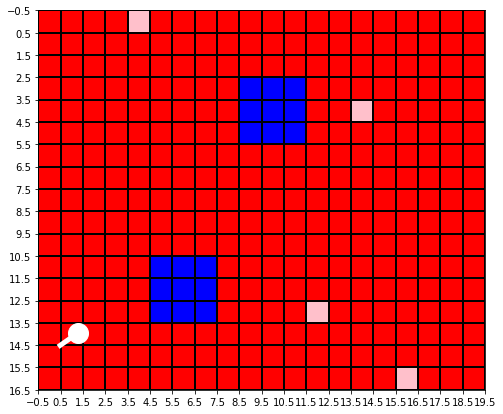

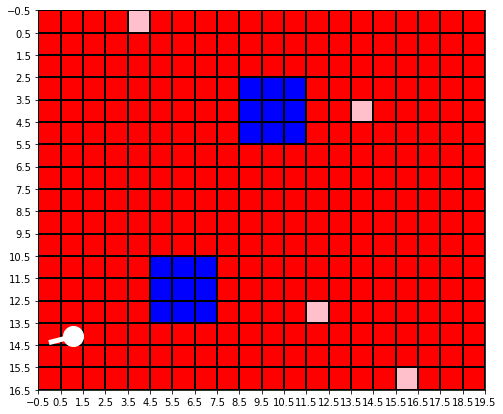

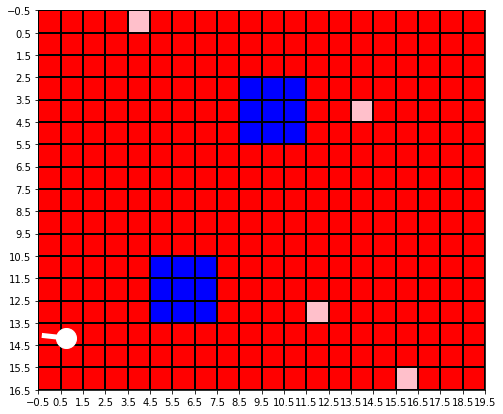

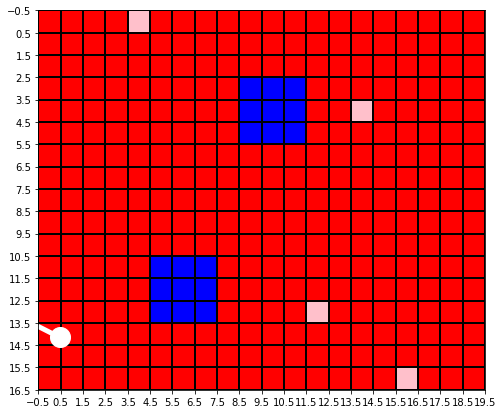

In [ ]:


episodes = 1
for episode in range(1, episodes+1):
    obs = env.reset()
    print('------------')
    done = False
    score = 0 
    k1=0
    k2=0
    for i in range(150):
        if done==True:
            break
        action, _states = model.predict(obs)
        if i>50 and k1==0:
          env.state[3]=1
          env.state[4:]=vectorize_map(init_reward_grid()[2])
          k1=1
          action, _states = model.predict(env.state)
        if i>100 and k2==0:
          env.state[3]=1
          env.state[4:]=vectorize_map(init_reward_grid()[2])
          k2=1
          action, _states = model.predict(env.state)
        
        
        obs, reward, dones, info = env.step(action)
        
        score+=reward
        plottagrid(env.reward_grid.reshape(size_x,size_y))
        #time.sleep(0.4)
        #print('mossa numero',env.mossa,'AREA COPERTA',env.state[3],'stato batteria',env.state[4])
        #print('posizione',np.round(env.state[0:3],2),'reward',reward,'azione',action_list[action])


In [ ]:
scores=[]
episodes = 10
states=np.zeros((episodes,3))
lista_mappe=np.zeros((17,20,episodes))
lista_azioni=np.zeros((episodes,200))
for episode in range(0, episodes):
    obs = env.reset()
    lista_mappe[:,:,episode]=env.reward_grid

    states[episode][0]=obs[0]
    states[episode][1]=obs[1]
    states[episode][2]=obs[2]
     
    done = False

    score=0
    for i in range(201):
       
        if done==True:
            scores.append(score)
            break
        if i==200:
            scores.append(score)
            break
        action, _states = model.predict(obs)
        obs, reward, done, info = env.step(action)

        lista_azioni[episode,1]=action
        score+=reward
                #plottagrid(env.reward_grid.reshape(size_x,size_y))
        #time.sleep(0.4)
        #print('mossa numero',env.mossa,'AREA COPERTA',env.state[3],'stato batteria',env.state[4])
        #print('posizione',np.round(env.state[0:3],2),'reward',reward,'azione',action_list[action])
#print(np.max(lista_azioni[:,3:],axis=1))
indice=scores.index(max(scores))
plt.hist(scores)
'''
obs = env.reset()

env.reward_grid=lista_mappe[:,:,indice]


print('------------')
done = False
for i in range(110):
    i
    action=lista_azioni[indice][i]
    action=int(action)
    obs, reward, dones, info = env.step(action)
    plottagrid(env.pixel_grid.reshape(size_x,size_y))'''

In [ ]:
a=np.zeros((2,3))
a[:,2]=[1,1]
a*2

array([[0., 0., 2.],
       [0., 0., 2.]])

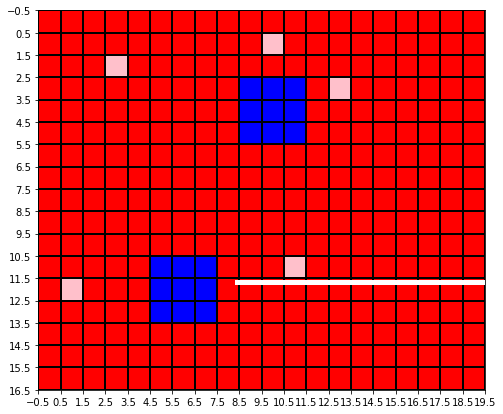

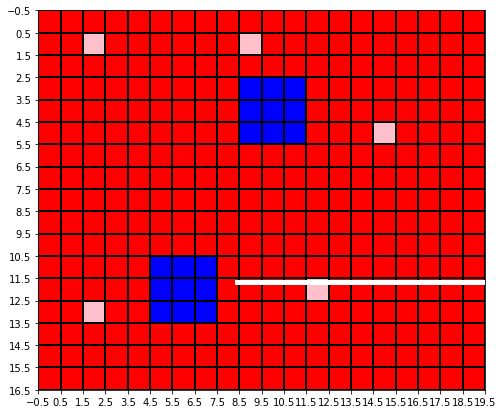

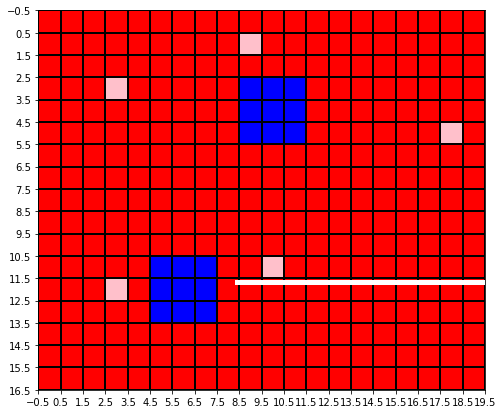

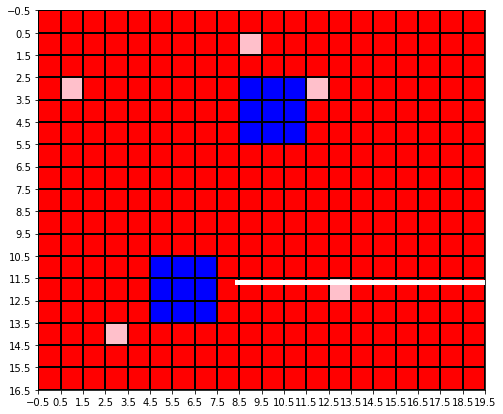

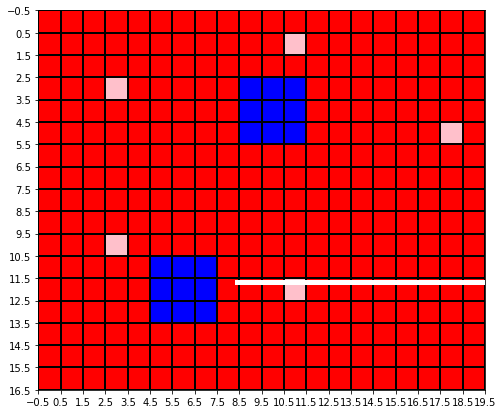

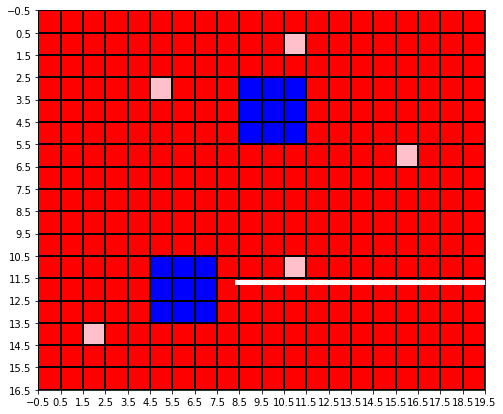

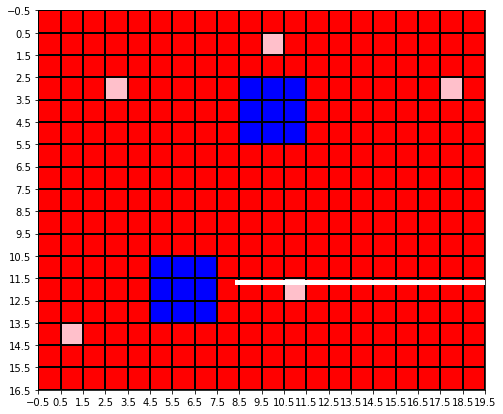

/usr/local/lib/python3.7/dist-packages/gym/spaces/box.py:74: UserWarning: WARN: Box bound precision lowered by casting to float32
  "Box bound precision lowered by casting to {}".format(self.dtype)


----------
partite vinte: 65747
partite con troppe mosse: 6826
area max ultime 100 partite: 21.199999999999957
----------


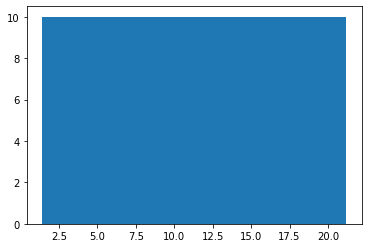

----------
partite vinte: 65752
partite con troppe mosse: 6826
area max ultime 100 partite: 22.199999999999953
----------


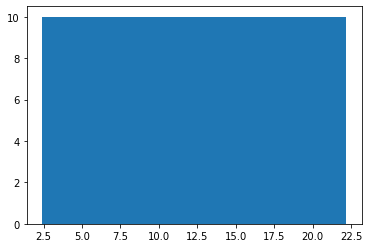

olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0]
olle [2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 2, 2, 0, 0]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 1]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 2, 1, 1]
olle [2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2

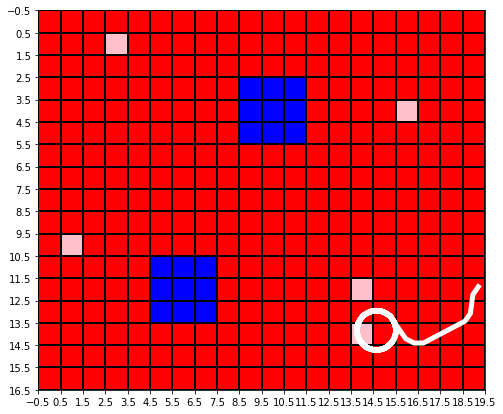

In [ ]:
def evaluate(model, num_episodes=10):
    """
    Evaluate a RL agent
    :param model: (BaseRLModel object) the RL Agent
    :param num_episodes: (int) number of episodes to evaluate it
    :return: (float) Mean reward for the last num_episodes
    """
    # This function will only work for a single Environment
    env=PiazzaDelPopolo()
    kkk=199
    current_reward=0
    past_reward=0
    mappa_passata=np.zeros((size_x,size_y,num_episodes))
    lista_stati_=np.zeros((2,kkk,num_episodes))
    rew=[]
    for i in range(num_episodes):
        current_reward=0
        done = False
        obs = env.reset()
        
        mappa_passata[:,:,i]=env.reward_grid
        reward=0
        for j in range(kkk):
            #if done==True:
            #  break
            # _states are only useful when using LSTM policies
            action, _states = model.predict(obs,deterministic=True)
            # here, action, rewards and dones are arrays
            # because we are using vectorized env
            obs, reward, done, info = env.step(action)
            lista_stati_[:,j,i]=obs[0:2]
            reward+=reward
        rew.append(reward)
    print(rew)
    indexx=rew.index(max(rew))
    cmap = colors.ListedColormap(['blue', 'red','green','pink'])
    bounds = [-2,-0.1,0.1,0.3,0.5]
    norm = colors.BoundaryNorm(bounds, cmap.N)

    lungo=1

    fig, ax = plt.subplots(figsize=(8, 8))
    #print(mappa_passata)
    ax.imshow(mappa_passata[:,:,indexx], cmap=cmap,norm=norm)
    ax.grid(which='major', axis='both', linestyle='-', color='k', linewidth=2)
    ax.set_xticks(np.arange(-0.5, 20, 1));

    ax.set_yticks(np.arange(-0.5, 17, 1)); 
    plt.plot(lista_stati_[1,1:,indexx]*size_y,lista_stati_[0,1:,indexx]*size_x,linewidth=5,color='white')


evaluate(model, num_episodes=100)

------------


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:291: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


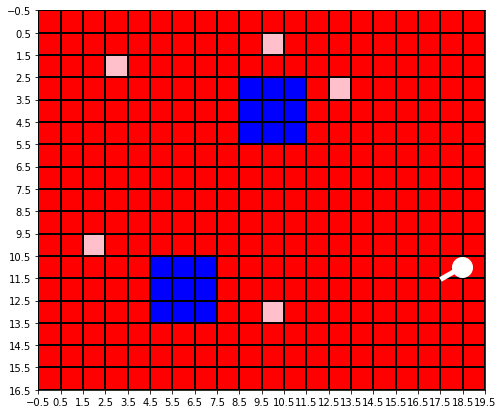

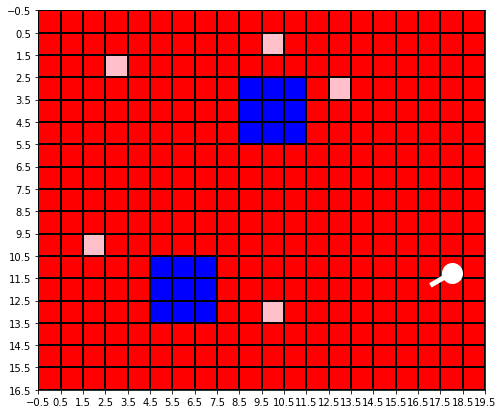

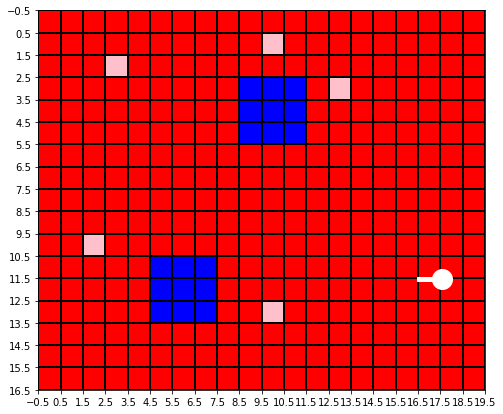

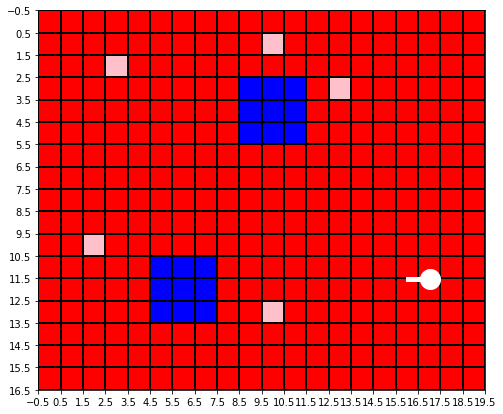

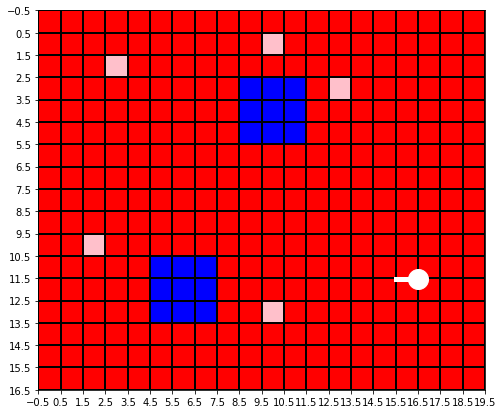

...

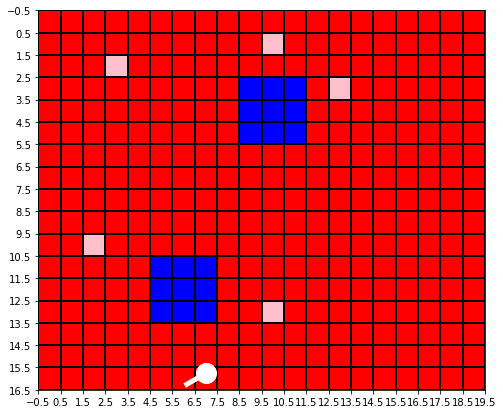

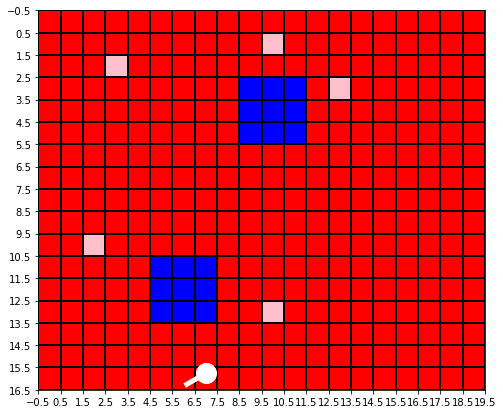

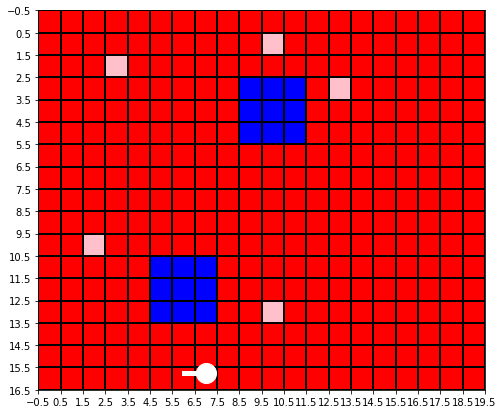

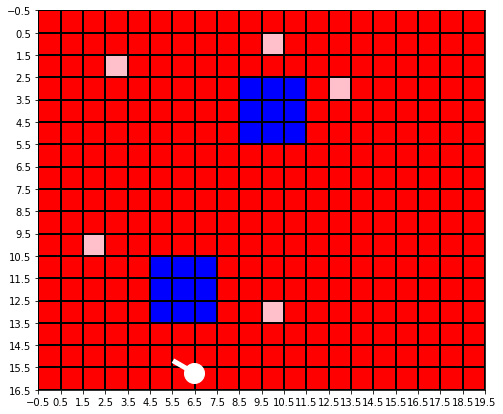

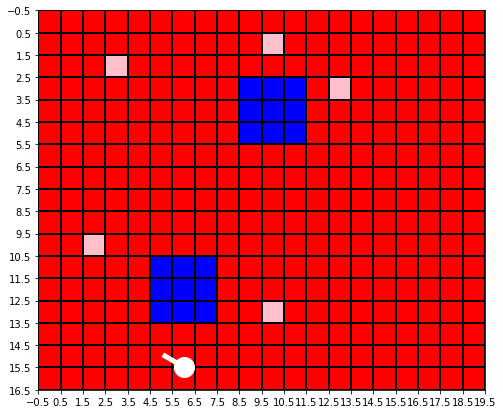

In [107]:
episodes = 1
for episode in range(1, episodes+1):
    obs = env.reset()
    print('------------')
    done = False

    for i in range(100):
        if done==True:
            break
        action, _states = model.predict(obs)
        obs, reward, dones, info = env.step(action)
        plottagrid(env.reward_grid.reshape(size_x,size_y))

In [ ]:
import warnings
from typing import Any, Callable, Dict, List, Optional, Tuple, Union

import gym
import numpy as np

from stable_baselines3.common import base_class
from stable_baselines3.common.vec_env import DummyVecEnv, VecEnv, VecMonitor, is_vecenv_wrapped




def evaluate_policy(
    model: "base_class.BaseAlgorithm",
    env: Union[gym.Env, VecEnv],
    n_eval_episodes: int = 10,
    deterministic: bool = True,
    render: bool = False,
    callback: Optional[Callable[[Dict[str, Any], Dict[str, Any]], None]] = None,
    reward_threshold: Optional[float] = None,
    return_episode_rewards: bool = False,
    warn: bool = True,
) -> Union[Tuple[float, float], Tuple[List[float], List[int]]]:
    """
    Runs policy for ``n_eval_episodes`` episodes and returns average reward.
    If a vector env is passed in, this divides the episodes to evaluate onto the
    different elements of the vector env. This static division of work is done to
    remove bias. See https://github.com/DLR-RM/stable-baselines3/issues/402 for more
    details and discussion.

    .. note::
        If environment has not been wrapped with ``Monitor`` wrapper, reward and
        episode lengths are counted as it appears with ``env.step`` calls. If
        the environment contains wrappers that modify rewards or episode lengths
        (e.g. reward scaling, early episode reset), these will affect the evaluation
        results as well. You can avoid this by wrapping environment with ``Monitor``
        wrapper before anything else.

    :param model: The RL agent you want to evaluate.
    :param env: The gym environment or ``VecEnv`` environment.
    :param n_eval_episodes: Number of episode to evaluate the agent
    :param deterministic: Whether to use deterministic or stochastic actions
    :param render: Whether to render the environment or not
    :param callback: callback function to do additional checks,
        called after each step. Gets locals() and globals() passed as parameters.
    :param reward_threshold: Minimum expected reward per episode,
        this will raise an error if the performance is not met
    :param return_episode_rewards: If True, a list of rewards and episode lengths
        per episode will be returned instead of the mean.
    :param warn: If True (default), warns user about lack of a Monitor wrapper in the
        evaluation environment.
    :return: Mean reward per episode, std of reward per episode.
        Returns ([float], [int]) when ``return_episode_rewards`` is True, first
        list containing per-episode rewards and second containing per-episode lengths
        (in number of steps).
    """
    is_monitor_wrapped = False
    # Avoid circular import
    from stable_baselines3.common.monitor import Monitor

    if not isinstance(env, VecEnv):
        env = DummyVecEnv([lambda: env])

    is_monitor_wrapped = is_vecenv_wrapped(env, VecMonitor) or env.env_is_wrapped(Monitor)[0]

    if not is_monitor_wrapped and warn:
        warnings.warn(
            "Evaluation environment is not wrapped with a ``Monitor`` wrapper. "
            "This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. "
            "Consider wrapping environment first with ``Monitor`` wrapper.",
            UserWarning,
        )

    n_envs = env.num_envs
    episode_rewards = []
    episode_lengths = []

    episode_counts = np.zeros(n_envs, dtype="int")
    # Divides episodes among different sub environments in the vector as evenly as possible
    episode_count_targets = np.array([(n_eval_episodes + i) // n_envs for i in range(n_envs)], dtype="int")

    current_rewards = np.zeros(n_envs)
    current_lengths = np.zeros(n_envs, dtype="int")
    observations = env.reset()
    states = None
    episode_starts = np.ones((env.num_envs,), dtype=bool)
    while (episode_counts < episode_count_targets).any():
        actions, states = model.predict(observations, state=states, episode_start=episode_starts, deterministic=deterministic)
        observations, rewards, dones, infos = env.step(actions)
        current_rewards += rewards
        current_lengths += 1
        for i in range(n_envs):
            if episode_counts[i] < episode_count_targets[i]:

                # unpack values so that the callback can access the local variables
                reward = rewards[i]
                done = dones[i]
                info = infos[i]
                episode_starts[i] = done

                if callback is not None:
                    callback(locals(), globals())

                if dones[i]:
                    if is_monitor_wrapped:
                        # Atari wrapper can send a "done" signal when
                        # the agent loses a life, but it does not correspond
                        # to the true end of episode
                        if "episode" in info.keys():
                            # Do not trust "done" with episode endings.
                            # Monitor wrapper includes "episode" key in info if environment
                            # has been wrapped with it. Use those rewards instead.
                            episode_rewards.append(info["episode"]["r"])
                            episode_lengths.append(info["episode"]["l"])
                            # Only increment at the real end of an episode
                            episode_counts[i] += 1
                    else:
                        episode_rewards.append(current_rewards[i])
                        episode_lengths.append(current_lengths[i])
                        episode_counts[i] += 1
                    current_rewards[i] = 0
                    current_lengths[i] = 0

        if render:
            env.render()

    mean_reward = np.mean(episode_rewards)
    std_reward = np.std(episode_rewards)
    if reward_threshold is not None:
        assert mean_reward > reward_threshold, "Mean reward below threshold: " f"{mean_reward:.2f} < {reward_threshold:.2f}"
    if return_episode_rewards:
        return episode_rewards, episode_lengths
    return mean_reward, std_reward


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:71: UserWarning: Evaluation environment is not wrapped with a ``Monitor`` wrapper. This may result in reporting modified episode lengths and rewards, if other wrappers happen to modify these. Consider wrapping environment first with ``Monitor`` wrapper.


mean_reward:11.06 +/- 2.95


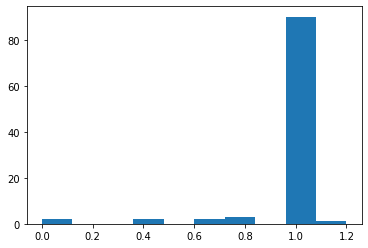

In [ ]:
# Use a separate environement for evaluation
eval_env=PiazzaDelPopolo()

# Random Agent, before training
mean_reward, std_reward = evaluate_policy(model, eval_env, n_eval_episodes=100)

print(f"mean_reward:{mean_reward:.2f} +/- {std_reward:.2f}")
plt.hist(lista_aree[len(lista_aree)-100:])
plt.show()